# init
全てここ参照
https://atatat.hatenablog.com/entry/colab_python8_animation


In [11]:
from __future__ import print_function, division
import numpy as np
import pandas as pd

# URL によるリソースへのアクセスを提供するライブラリをインポートする。
import urllib.request 

# 図やグラフを図示するためのライブラリをインポートする。
import matplotlib.pyplot as plt

import sklearn #機械学習のライブラリ
from sklearn.decomposition import PCA #主成分分析器
from matplotlib import animation, rc
from IPython.display import HTML


In [12]:
def logistic(a, x):
  return 1.0-(a*x)*x

def next_x(f, N, x):
    x_new = np.empty(x.shape)
    ave=(eps/float(N))*np.sum(list(map(f, np.tile(r, x.size), x)))
    x_new = (1-eps)*f(r, x) + ave #この行と前列の行の違いはmapを使うかどうかで生じる.
    return x_new

# 1000nodes GCM

In [13]:
%matplotlib notebook 
# 必要か??
L = 1000      # no. of lattice sites
eps = 0.2   # diffusive coupling strength: 
r = 1.92     # control parameter r:
P1 = float(2**8) # accuracy
P2 = float(2**12)
"""
時刻 n , 精度 P クラスター数 (k_n)^P の表示
ex: 1/P=2^(-18), 2^(-12)
p150参照
"""
np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)

nTransients = 100   # The iterates we'll throw away
nSteps = 90000       # This sets how many time steps will be described

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

for i in range(nTransients):
  ic=next_x(logistic, L, ic)

states[0]=ic
class_numsP1=[]
class_numsP2=[]
for i in range(nSteps-1):
  states[i+1]=next_x(logistic, L, states[i])
  
  #clusteringP1
  clustering_list = list(map(lambda x: float(int(x*P1))/P1, states[i])) 
  """以下で異なる値の数を取り出す. ユニークな値のみを抽出.
  https://note.nkmk.me/python-list-unique-duplicate/
  """
  num=len(list(set(clustering_list)) )
  class_numsP1.append(num)

  #clusteringP2
  clustering_list = list(map(lambda x: float(int(x*P2))/P2, states[i])) 
  num=len(list(set(clustering_list)) )
  class_numsP2.append(num)

#最後だけ追加P1
clustering_list = list(map(lambda x: float(int(x*P1))/P1, states[nSteps-1])) 
num=len(list(set(clustering_list)) )
class_numsP1.append(num)

#最後だけ追加P2
clustering_list = list(map(lambda x: float(int(x*P2))/P2, states[nSteps-1])) 
num=len(list(set(clustering_list)) )
class_numsP2.append(num)

In [16]:
print(class_numsP1)
print(class_numsP2)

[15, 7, 12, 11, 18, 9, 14, 13, 17, 7, 9, 9, 11, 7, 10, 10, 14, 7, 9, 7, 12, 7, 9, 9, 13, 5, 6, 6, 9, 4, 5, 5, 7, 4, 4, 5, 6, 5, 7, 6, 9, 3, 5, 5, 6, 6, 9, 7, 9, 5, 9, 9, 12, 11, 13, 9, 12, 11, 12, 12, 13, 12, 14, 13, 14, 10, 13, 12, 16, 11, 16, 12, 16, 8, 11, 10, 13, 9, 15, 12, 15, 11, 16, 16, 23, 15, 21, 13, 23, 14, 27, 12, 21, 19, 30, 8, 12, 11, 18, 13, 24, 13, 23, 18, 34, 16, 31, 23, 42, 21, 41, 27, 48, 27, 42, 26, 44, 32, 47, 25, 36, 24, 37, 21, 28, 21, 30, 19, 26, 24, 33, 19, 31, 24, 35, 13, 19, 19, 27, 20, 30, 14, 25, 19, 34, 22, 37, 20, 40, 19, 35, 24, 41, 23, 40, 25, 40, 38, 51, 21, 41, 20, 36, 36, 49, 44, 56, 44, 67, 38, 52, 34, 50, 22, 44, 33, 51, 15, 35, 35, 54, 29, 42, 16, 29, 23, 38, 20, 36, 27, 43, 17, 34, 33, 55, 28, 42, 26, 40, 22, 34, 19, 29, 25, 32, 22, 35, 17, 23, 22, 30, 28, 41, 35, 49, 20, 31, 20, 39, 41, 60, 30, 47, 52, 72, 63, 78, 73, 88, 93, 68, 86, 105, 58, 85, 108, 85, 107, 76, 101, 103, 76, 95, 106, 81, 117, 124, 127, 115, 111, 111, 90, 109, 87, 118, 86, 92, 

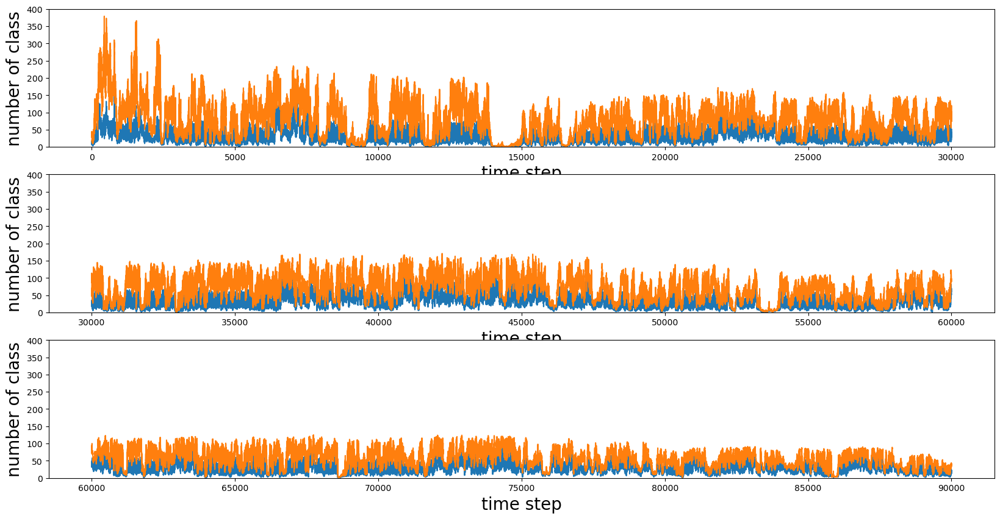

In [21]:
#plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)

#図の作成指示
fig=plt.figure(figsize=(20,10))
ax1=fig.subplots(3,1)

time=np.arange(nSteps)

# p150参照, clustering
ax1[0].set_xlabel("time step", fontsize=20)
ax1[0].set_ylabel("number of class", fontsize=20)
ax1[0].set_ylim(0,400)
ax1[0].plot(time[:nSteps//3], class_numsP1[:nSteps//3])
ax1[0].plot(time[:nSteps//3], class_numsP2[:nSteps//3])

ax1[1].set_xlabel("time step", fontsize=20)
ax1[1].set_ylabel("number of class", fontsize=20)
ax1[1].set_ylim(0,400)
ax1[1].plot(time[nSteps//3:nSteps//3*2], class_numsP1[nSteps//3:nSteps//3*2])
ax1[1].plot(time[nSteps//3:nSteps//3*2], class_numsP2[nSteps//3:nSteps//3*2])

ax1[2].set_xlabel("time step", fontsize=20)
ax1[2].set_ylabel("number of class", fontsize=20)
ax1[2].set_ylim(0,400)
ax1[2].plot(time[nSteps//3*2:], class_numsP1[nSteps//3*2:])
ax1[2].plot(time[nSteps//3*2:], class_numsP2[nSteps//3*2:])

# Display plot in window
plt.show()

## PCA

In [9]:
df=pd.DataFrame(states)
# 行列の標準化
dfs = df.iloc[:, 1:].apply(lambda x: (x-x.mean())/x.std(), axis=0)
dfs.head()

#主成分分析の実行
pca = PCA()
pca.fit(dfs)
# データを主成分空間に写像
feature = pca.transform(dfs)
"""
# 主成分得点
pd.DataFrame(feature, columns=["PC{}".format(x + 1) for x in range(len(dfs.columns))]).head()
"""
# 第1,2,3主成分をプロット


'\n# 主成分得点\npd.DataFrame(feature, columns=["PC{}".format(x + 1) for x in range(len(dfs.columns))]).head()\n'

### animation

全てここ参照
https://atatat.hatenablog.com/entry/colab_python8_animation

plot点の消去
https://blog.amedama.jp/entry/2018/07/13/001155#%E5%8B%95%E7%9A%84%E3%81%AB%E3%82%B0%E3%83%A9%E3%83%95%E3%82%92%E7%94%9F%E6%88%90%E3%81%99%E3%82%8B

plt.cla()
ではなく,
ax1.cla()
https://qiita.com/osanshouo/items/3c66781f41884694838b


In [10]:
%matplotlib inline
fig=plt.figure(figsize=(10,4))#(figsize=(100,100))
ax1 = fig.add_subplot(111, projection='3d')

# 3Dグラフの見る方向の初期値を設定
#ax1.view_init(elev=10, azim=80)

#図の設定
#軸ラベル
ax1.set_xlabel("PC1",fontsize=20)
ax1.set_ylabel("PC2",fontsize=20)  
ax1.set_zlabel("PC3",fontsize=20) 

def animate(i):
    ax1.view_init(elev=30., azim=3.6*i%360)
    ln=ax1.plot(feature[i*900:(i+1)*900, 0], feature[i*900:(i+1)*900, 1], feature[i*900:(i+1)*900, 2], 
                "o", markersize=2)
    return ln

ani = animation.FuncAnimation(fig, animate, init_func=None,
                               frames=100, interval=100, blit=True)  
plt.close()

# JavascriptウィジェットをアニメーションオブジェクトのデフォルトのHTML表現として設定
rc('animation', html='jshtml')
ani

In [15]:
%matplotlib inline
fig=plt.figure(figsize=(10,4))#(figsize=(100,100))
ax1 = fig.add_subplot(111, projection='3d')

# 3Dグラフの見る方向の初期値を設定
#ax1.view_init(elev=10, azim=80)

#図の設定
#軸ラベル
ax1.set_xlabel("PC1",fontsize=20)
ax1.set_ylabel("PC2",fontsize=20)  
ax1.set_zlabel("PC3",fontsize=20) 

def animate(i):
    
    ax1.cla()
    ax1.view_init(elev=30., azim=3.6*i%360)
    ln=ax1.plot(feature[i*900:(i+1)*900, 0], feature[i*900:(i+1)*900, 1], feature[i*900:(i+1)*900, 2], 
                "o", markersize=2)
    return ln

ani = animation.FuncAnimation(fig, animate, init_func=None,
                               frames=100, interval=100, blit=True)  
plt.close()

# JavascriptウィジェットをアニメーションオブジェクトのデフォルトのHTML表現として設定
rc('animation', html='jshtml')
ani

# 50nodes GCM

In [22]:
def logistic(a, x):
  return 1.0-(a*x)*x

def next_x(f, N, x):
    x_new = np.empty(x.shape)
    ave=(eps/float(N))*np.sum(list(map(f, np.tile(r, x.size), x)))
    x_new = (1-eps)*f(r, x) + ave #この行と前列の行の違いはmapを使うかどうかで生じる.
    return x_new

## cluster

In [25]:
L = 50      # no. of lattice sites
eps = 0.2   # diffusive coupling strength: 
r = 1.92     # control parameter r:
P1 = float(2**8) # accuracy
P2 = float(2**12)
"""
時刻 n , 精度 P クラスター数 (k_n)^P の表示
ex: 1/P=2^(-18), 2^(-12)
p150参照
"""
np.random.seed(1010)
ic = np.random.uniform(0.1, 0.9, L)  # random initial condition betn. (0,1)

nTransients = 100   # The iterates we'll throw away
nSteps = 90000       # This sets how many time steps will be described

#縦 site, 横 time(step)
states = np.empty((nSteps, L))

for i in range(nTransients):
  ic=next_x(logistic, L, ic)

states[0]=ic
class_numsP1=[]
class_numsP2=[]
for i in range(nSteps-1):
  states[i+1]=next_x(logistic, L, states[i])
  
  #clusteringP1
  clustering_list = list(map(lambda x: float(int(x*P1))/P1, states[i])) 
  """以下で異なる値の数を取り出す. ユニークな値のみを抽出.
  https://note.nkmk.me/python-list-unique-duplicate/
  """
  num=len(list(set(clustering_list)) )
  class_numsP1.append(num)

  #clusteringP2
  clustering_list = list(map(lambda x: float(int(x*P2))/P2, states[i])) 
  num=len(list(set(clustering_list)) )
  class_numsP2.append(num)

#最後だけ追加P1
clustering_list = list(map(lambda x: float(int(x*P1))/P1, states[nSteps-1])) 
num=len(list(set(clustering_list)) )
class_numsP1.append(num)

#最後だけ追加P2
clustering_list = list(map(lambda x: float(int(x*P2))/P2, states[nSteps-1])) 
num=len(list(set(clustering_list)) )
class_numsP2.append(num)

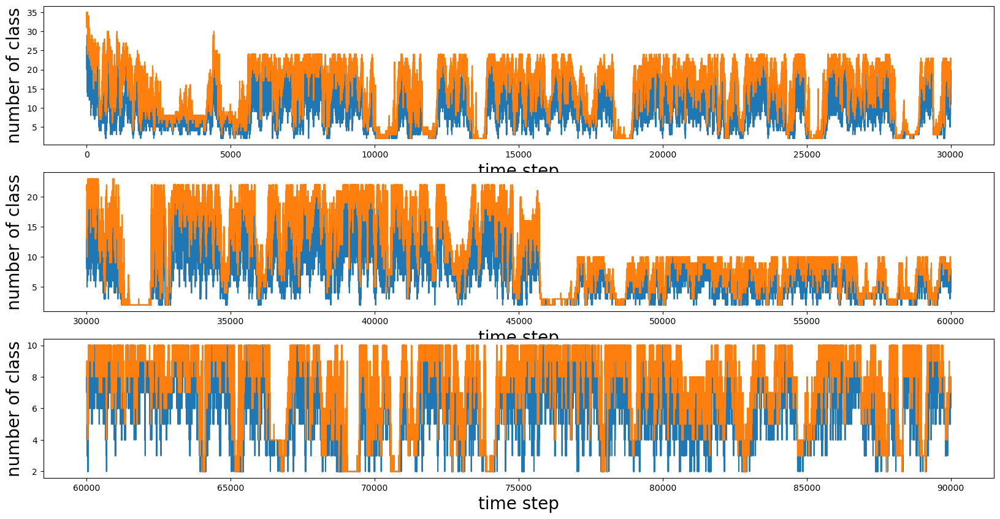

In [26]:
#plt.rcParams["figure.figsize"] = (40, 20)#(縦, 横)
#図の作成指示
fig=plt.figure(figsize=(20,10))
ax1=fig.subplots(3,1)

time=np.arange(nSteps)

# p150参照, clustering
ax1[0].set_xlabel("time step", fontsize=20)
ax1[0].set_ylabel("number of class", fontsize=20)
ax1[0].plot(time[:nSteps//3], class_numsP1[:nSteps//3])
ax1[0].plot(time[:nSteps//3], class_numsP2[:nSteps//3])

ax1[1].set_xlabel("time step", fontsize=20)
ax1[1].set_ylabel("number of class", fontsize=20)
ax1[1].plot(time[nSteps//3:nSteps//3*2], class_numsP1[nSteps//3:nSteps//3*2])
ax1[1].plot(time[nSteps//3:nSteps//3*2], class_numsP2[nSteps//3:nSteps//3*2])

ax1[2].set_xlabel("time step", fontsize=20)
ax1[2].set_ylabel("number of class", fontsize=20)
ax1[2].plot(time[nSteps//3*2:], class_numsP1[nSteps//3*2:])
ax1[2].plot(time[nSteps//3*2:], class_numsP2[nSteps//3*2:])

# Display plot in window
plt.show()

## PCA

In [ ]:
df=pd.DataFrame(states)
# 行列の標準化
dfs = df.iloc[:, 1:].apply(lambda x: (x-x.mean())/x.std(), axis=0)
dfs.head()

#主成分分析の実行
pca = PCA()
pca.fit(dfs)
# データを主成分空間に写像
feature = pca.transform(dfs)
"""
# 主成分得点
pd.DataFrame(feature, columns=["PC{}".format(x + 1) for x in range(len(dfs.columns))]).head()
"""
# 第1,2,3主成分をプロット


'\n# 主成分得点\npd.DataFrame(feature, columns=["PC{}".format(x + 1) for x in range(len(dfs.columns))]).head()\n'

### animation

In [ ]:
%matplotlib inline

fig=plt.figure(figsize=(10,4))#(figsize=(100,100))
ax1 = fig.add_subplot(111, projection='3d')

# 3Dグラフの見る方向の初期値を設定
#ax1.view_init(elev=10, azim=80)

#図の設定
#軸ラベル
ax1.set_xlabel("PC1",fontsize=20)
ax1.set_ylabel("PC2",fontsize=20)  
ax1.set_zlabel("PC3",fontsize=20) 

def animate(i):
    ax1.view_init(elev=30., azim=3.6*i%360)
    ln=ax1.plot(feature[i*900:(i+1)*900, 0], feature[i*900:(i+1)*900, 1], feature[i*900:(i+1)*900, 2], 
                "o", markersize=2)
    return ln

ani = animation.FuncAnimation(fig, animate, init_func=None,
                               frames=100, interval=100, blit=True)  
plt.close()

# JavascriptウィジェットをアニメーションオブジェクトのデフォルトのHTML表現として設定
rc('animation', html='jshtml')
ani

Output hidden; open in https://colab.research.google.com to view.

In [ ]:
%matplotlib inline

fig=plt.figure(figsize=(10,4))#(figsize=(100,100))
ax1 = fig.add_subplot(111, projection='3d')

# 3Dグラフの見る方向の初期値を設定
#ax1.view_init(elev=10, azim=80)

#図の設定
#軸ラベル
ax1.set_xlabel("PC1",fontsize=20)
ax1.set_ylabel("PC2",fontsize=20)  
ax1.set_zlabel("PC3",fontsize=20) 

def animate(i):
    
    ax1.cla()
    ax1.view_init(elev=30., azim=3.6*i%360)
    ln=ax1.plot(feature[i*900:(i+1)*900, 0], feature[i*900:(i+1)*900, 1], feature[i*900:(i+1)*900, 2], 
                "o", markersize=2)
    return ln

ani = animation.FuncAnimation(fig, animate, init_func=None,
                               frames=100, interval=100, blit=True)  
plt.close()

# JavascriptウィジェットをアニメーションオブジェクトのデフォルトのHTML表現として設定
rc('animation', html='jshtml')
ani

Output hidden; open in https://colab.research.google.com to view.